# PBMC 10k Multiome: Cross-Modal Clustering Analysis

Compares clustering solutions from scRNA-seq (RNA) and scATAC-seq (ATAC) on the same 9,554 PBMCs.
Clustering was performed independently across a K-sweep per modality, aligned with **Clumppling**,
then compared across modalities with **compModels**.

**Sections**
1. Setup & data loading
2. Load Clumppling / compModels results
3. Overview: mode alignment grid
4. Cross-modal comparison (K = 5–8)
5. Analyze selected modes (RNA K6M1 & ATAC K7M1)
6. Gene–peak link analysis
7. Aggregate & visualize gene–peak links


## 1. Setup

In [7]:
from pathlib import Path
from collections import defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from importlib.resources import files

import ace_of_clust as aoc


In [8]:
base_dir = Path("/oscar/data/sramacha/users/xliu293/sc-clumppling")
proj_name = "pbmc10k-hv"
cls_type  = "ft"

models   = ["rna", "atac"]
data_dir = base_dir / "data" / "pbmc10k_processed"

model_comp_dir        = base_dir / "output" / "comp_models" / f"{proj_name}_{cls_type}"
model_comp_output_dir = base_dir / "output" / "comp_models" / f"{proj_name}_{cls_type}_output"
model_align_dirs = [
    base_dir / "output" / f"aligned_{proj_name}-rna" / cls_type,
    base_dir / "output" / f"aligned_{proj_name}-atac" / cls_type,
]
model_cls_dirs = [
    base_dir / "output" / f"{proj_name}-rna-{cls_type}" / cls_type,
    base_dir / "output" / f"{proj_name}-atac-{cls_type}" / cls_type,
]
res_dir = base_dir / "output" / "comp_models" / f"{proj_name}_{cls_type}_links_new"
res_dir.mkdir(parents=True, exist_ok=True)


### Reference Data

In [3]:
# UMAP coordinates (RNA-derived)
coord_file = data_dir / "auxiliary" / "rna_umap.txt"
X_umap = np.loadtxt(coord_file).astype(float)

# Highly variable features per modality
used_features = {}
for mod in models:
    feature_file = data_dir / "main" / mod / "hv_from_scanpy.txt"
    used_features[mod] = pd.read_csv(feature_file, header=None)[0].astype(str).tolist()
    print(f"  #{mod} features: {len(used_features[mod])}")


  #rna features: 3026
  #atac features: 14896


In [4]:
# Cell-type annotation labels
annot_file = base_dir / "data" / "pbmc10k_processed" / "auxiliary" / "rna_celltype.txt"
cell_file  = base_dir / "data" / "pbmc10k_processed" / "main" / "rna_cells.txt"
annotation_labels_raw = np.loadtxt(annot_file, dtype=str, delimiter="\t")
cells_bc = np.loadtxt(cell_file, dtype=str)

cell_type_order = [
    "naïve/memory B", "CD14 mono", "CD8+ naïve T", "CD4+ memory T",
    "NK", "pDC", "CD16 mono", "CD4+ naïve T", "MAIT",
    "CD8+ activated T", "intermediate mono", "mDC",
]
df_ref_clusters = pd.DataFrame({
    "cell": cells_bc, "annot": annotation_labels_raw,
    "X": X_umap[:, 0], "Y": X_umap[:, 1],
})
df_ref_clusters["annot"] = (
    df_ref_clusters["annot"]
    .replace({"naïve B": "naïve/memory B", "memory B": "naïve/memory B"})
    .pipe(pd.Categorical, categories=cell_type_order, ordered=True)
)
df_ref_clusters["annot_idx"] = df_ref_clusters["annot"].cat.codes
annotation_labels = df_ref_clusters["annot"].values
lbs = annotation_labels
print(df_ref_clusters["annot"].value_counts().to_string())


annot
CD4+ memory T        1592
CD14 mono            1542
CD8+ naïve T         1399
CD4+ naïve T         1349
intermediate mono    1005
naïve/memory B        734
CD8+ activated T      704
NK                    459
CD16 mono             407
mDC                   161
MAIT                  107
pDC                    95


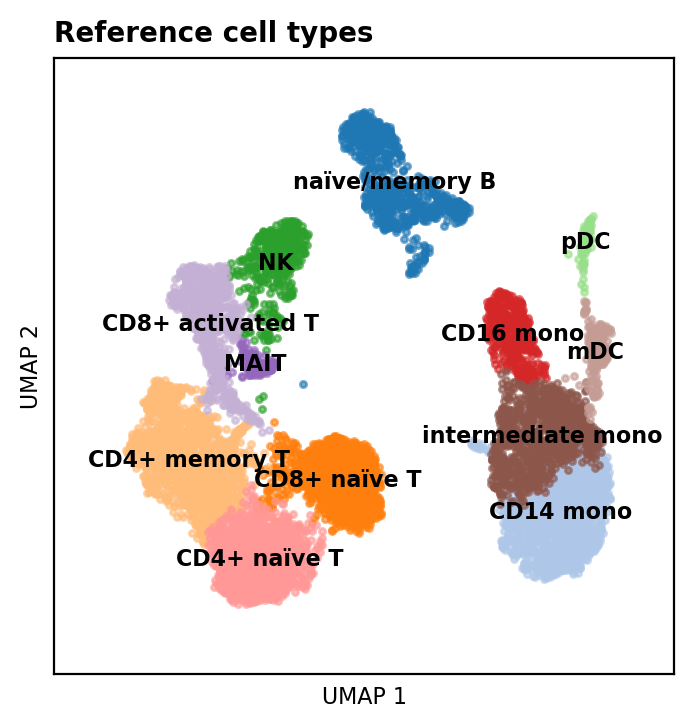

In [5]:
K_ref  = df_ref_clusters["annot"].nunique()
labels = df_ref_clusters["annot"].cat.categories.tolist()
sns_colors = sns.color_palette("tab20", n_colors=K_ref).as_hex()

fig, ax = plt.subplots(figsize=(4, 4), dpi=200)
for i_cls, cls in enumerate(labels):
    idx = np.where(lbs == cls)[0]
    ax.scatter(df_ref_clusters.iloc[idx]["X"], df_ref_clusters.iloc[idx]["Y"],
               s=5, alpha=0.6, color=sns_colors[i_cls])
    ax.text(df_ref_clusters.iloc[idx]["X"].mean(), df_ref_clusters.iloc[idx]["Y"].mean(),
            str(cls), fontsize=8, ha="center", va="center", color="black", weight="bold")
ax.set_title("Reference cell types", fontsize=10, loc="left", weight="bold")
ax.set_xlabel("UMAP 1", fontsize=8)
ax.set_ylabel("UMAP 2", fontsize=8)
ax.set_xlim([-10, 18]); ax.set_ylim([-10, 18])
ax.set_xticks([]); ax.set_yticks([])

fig.savefig(res_dir / "reference_cell_types.png", bbox_inches="tight", dpi=200)

In [9]:
# Load and process ATAC peak annotation
# Format: chr1_10109_10357 → chr1:10109-10357
peak_annot_file = base_dir / "data" / "pbmc10k" / "atac_peak_annotation.tsv"
peak_annotations = pd.read_csv(peak_annot_file, sep="\t")
peak_annotations["peak"] = (
    peak_annotations["peak"].str.replace("_", ":", n=1).str.replace("_", "-", n=1)
)

# Explode semicolon-separated gene / distance / peak_type per row
cols = ["gene", "distance", "peak_type"]
peak_annot_flat = (
    peak_annotations
    .assign(**{c: peak_annotations[c].str.split(";") for c in cols})
    .explode(cols, ignore_index=True)
)
print(f"Peak annotation: {len(peak_annotations)} peaks → {len(peak_annot_flat)} rows after exploding")


Peak annotation: 108377 peaks → 141066 rows after exploding


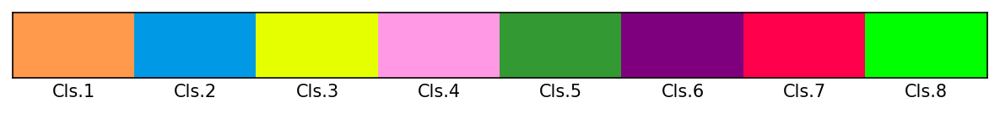

In [10]:
# Load default Clumppling cluster colours
path = files("ace_of_clust").joinpath("resources/distruct_colors.txt")
default_colors = path.read_text().splitlines()
fig, _, _ = aoc.plot_discrete_colorbar(default_colors[:8], K_max=8)


## 2. Load Clumppling Results

In [11]:
# Cross-modal compModels results
comp_res = aoc.load_compmodels_results(
    res_dir=model_comp_output_dir,
    input_dir=model_comp_dir,
)
pair_mappings = aoc.get_mode_pair_mappings(
    mode_names=comp_res.full_mode_names,
    all_modes_alignment=comp_res.all_modes_alignment,
    alignment_acrossK=comp_res.alignment_across_all,
)
print(f"Loaded {len(comp_res.full_mode_names)} aligned modes from {len(comp_res.models)} models.")
for model in comp_res.models:
    print(f"  {model}: {comp_res.modes_by_model[model]}")


Loaded 23 aligned modes from 2 models.
  atac: ['K3M1', 'K4M1', 'K5M1', 'K6M1', 'K7M1', 'K8M1', 'K9M1', 'K10M1', 'K11M1', 'K11M2', 'K12M1']
  rna: ['K3M1', 'K4M1', 'K4M2', 'K5M1', 'K6M1', 'K7M1', 'K8M1', 'K9M1', 'K9M2', 'K10M1', 'K11M1', 'K12M1']


In [12]:
# Per-modality Clumppling results; inject cross-modal alignments
res_models_unaligned = {}
for i, model in enumerate(models):
    res_models_unaligned[model] = aoc.load_clumppling_results(
        align_dir=model_align_dirs[i],
        suffix="rep",
        cls_dir=model_cls_dirs[i],
        load_unaligned=True,
        load_P=True,
    )

res_models = {}
for model in models:
    model_modes_alignment = {
        k.split("_")[-1]: v
        for k, v in comp_res.all_modes_alignment.items()
        if k.split("_")[0] == model
    }
    res_models[model] = aoc.add_pairwise_alignment(
        res_models_unaligned[model], model_modes_alignment
    )


## 3. Overview: Mode Alignment Grid

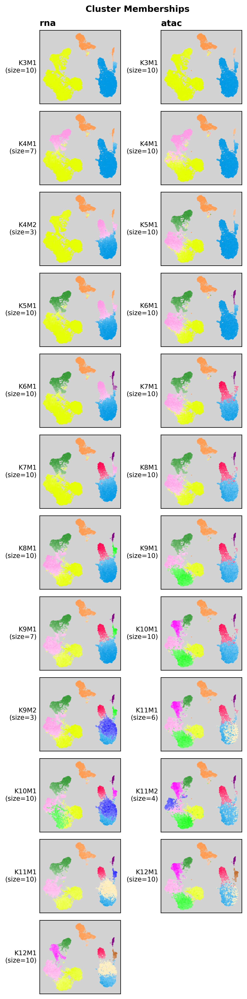

In [14]:
fig, ax = aoc.plot_compmodels_Q_grid(
    comp_res, X_umap,
    models_plot_order=models,
    colors=default_colors[:comp_res.K_max],
    val_threshold=0.5,
    suptitle="Cluster Memberships",
    y_suptitle=0.9,
    s=0.5,
    figsize_scale=(2.5, 2.0),
)


## 4. Cross-Modal Comparison (K = 5–8)

In [15]:
comp_sub = aoc.subset_compmodels(comp_res, K_min=5, K_max=8)


[Text(3.5, 0, 'RNA'), Text(13.5, 0, 'ATAC')]

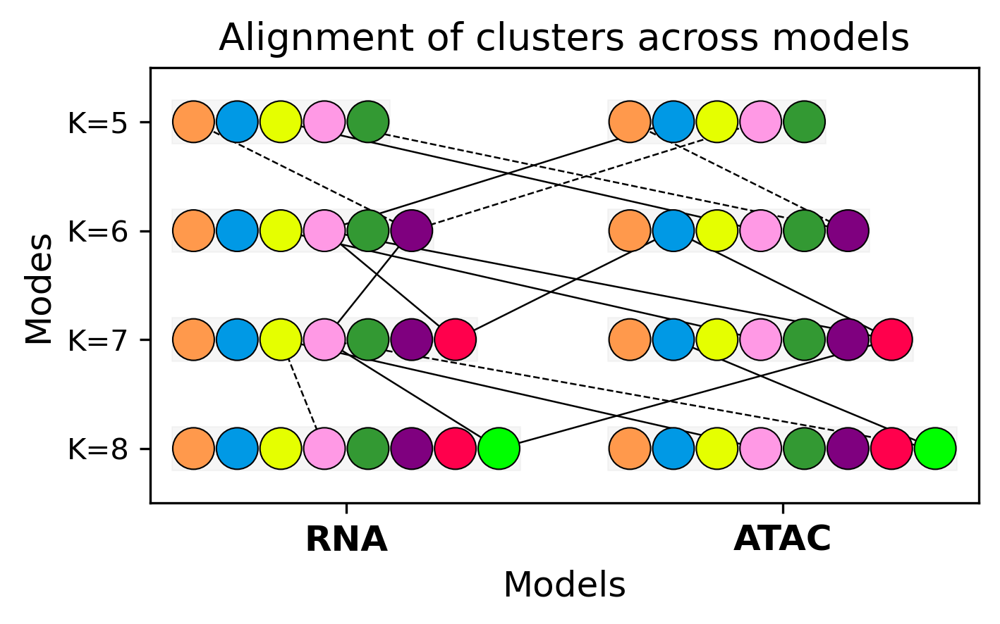

In [16]:
fig, ax = aoc.plot_compmodels_alignment_by_model(
    comp_sub,
    cmap=default_colors[:comp_sub.K_max],
    pair_mappings=pair_mappings,
    connect_identity=False,
    adjacent_only=True,
    label_modes=False,
    alt_ls=True, ls_alt=("-", "--"), lw=0.6,
    figsize_scale=(0.3, 2.5), dpi=300,
    row_by_K=True, models_plot_order=models,
)
ax.set_ylabel("Modes", fontsize=12)
ax.set_yticklabels(["K=5", "K=6", "K=7", "K=8"])
ax.set_title("Alignment of clusters across models", fontsize=13)
ax.set_xticklabels(["RNA", "ATAC"], rotation=0)


### Mode Differences Relative to RNA K5M1

In [17]:
ref_mode = "rna_K5M1"
_, mode_group_diff = aoc.compute_all_mode_diffs(
    comp_results=comp_sub, ref_mode=ref_mode,
    pair_mappings=pair_mappings, annotation_labels=lbs, aggregation="sum",
)
df_mode_group_diff = aoc.build_diff_df(mode_group_diff, sort_index=False)

# RNA modes first, then ATAC
full_mode_names_reordered = np.array([
    m for model in models
    for m in comp_sub.full_mode_names if m.startswith(model)
])
df_mode_group_diff = df_mode_group_diff.loc[full_mode_names_reordered]


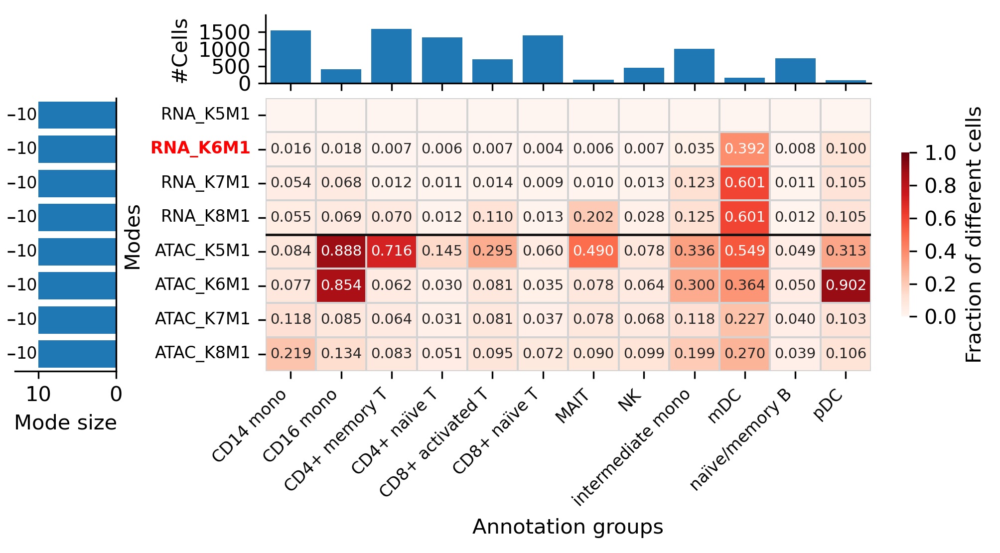

In [23]:
fig, axes = aoc.plot_group_diff(
    df_mode_group_diff,
    annotation_group_sizes=aoc.compute_group_sizes(annotation_labels),
    mode_sizes=aoc.get_mode_sizes(comp_sub),
    ref_mode=ref_mode,
    figsize=(6.5, 3.5), width_ratios=(1, 6), height_ratios=(1, 4), wspace=0,
    top_ylabel="#Cells",
)
axes["top"].set_xticklabels([])
axes["top"].set_yticks([0, 500, 1000, 1500])
axes["left"].set_xlim(0, 13)
axes["left"].invert_xaxis()
axes["heatmap"].set_yticklabels(
    [m.upper() for m in full_mode_names_reordered], fontsize=8
)

fig.savefig(res_dir / "mode_annotation_heatmap.png", bbox_inches="tight", dpi=200)


### Cross-Modal Pairwise Membership Difference

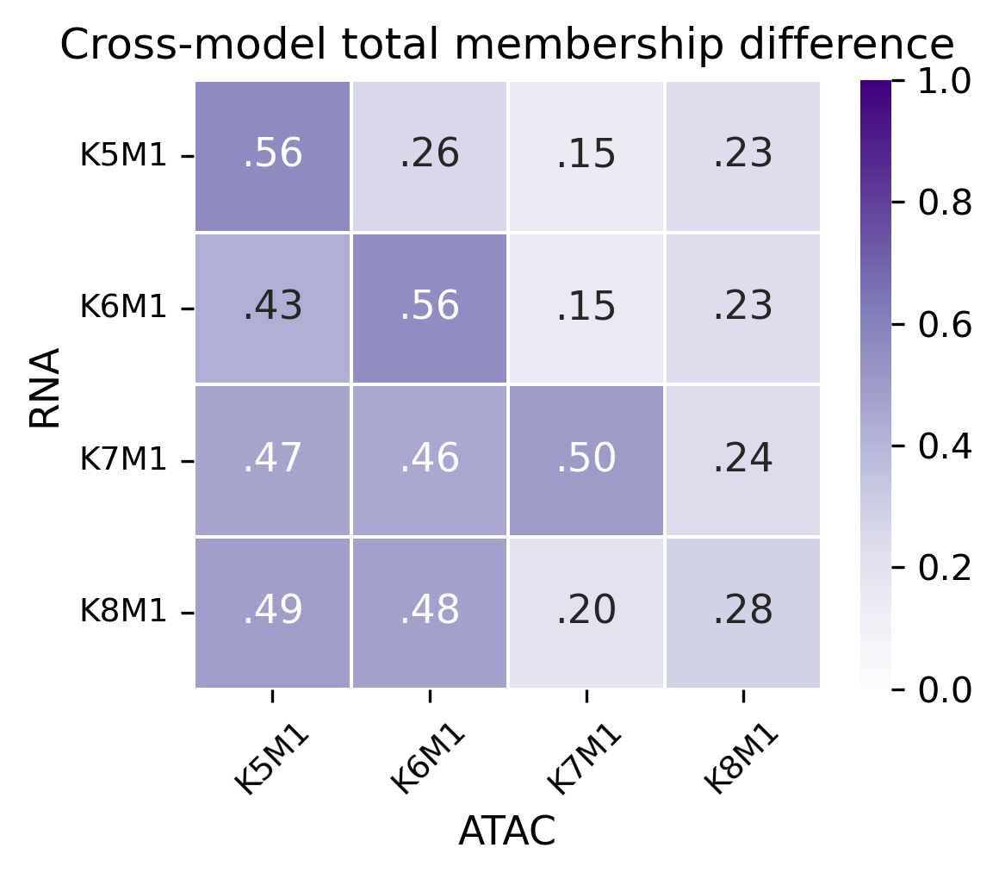

In [24]:
cross_model_diff_Q = aoc.get_pairwise_diff(
    comp_sub.full_mode_names_by_model[models[0]],
    comp_sub.full_mode_names_by_model[models[1]],
    pair_mappings, comp_sub,
)
cross_model_membership_diff = aoc.get_pairwise_membership_diff(cross_model_diff_Q)

fig, ax, mat = aoc.plot_model_diff_heatmap(
    cross_model_overall_membership_diff=cross_model_membership_diff,
    comp_res=comp_sub, models=models,
    annot_size=11, cmap='Purples', figsize=(4, 3.5), dpi=300,
)
ax.set_xticklabels([l.split("_")[-1].upper() for l in mat.columns], rotation=45, fontsize=9)
ax.set_yticklabels([l.split("_")[-1].upper() for l in mat.index], fontsize=9)
ax.set_title("Cross-model total membership difference", fontsize=12)
ax.set_ylabel("RNA", fontsize=11)
ax.set_xlabel("ATAC", fontsize=11)
fig.tight_layout()
fig.savefig(res_dir / "cross_model_diff_heatmap.png", bbox_inches="tight", dpi=300)

## 5. Analyze Selected Modes

Select **RNA K6M1** and **ATAC K7M1** for deeper comparison.

In [20]:
selected_modes = {"rna": "K6M1", "atac": "K7M1"}

ref_mode = f"rna_{selected_modes['rna']}"
alt_mode = f"atac_{selected_modes['atac']}"
ref_Q = comp_sub.get_Q(ref_mode)
alt_Q = comp_sub.get_Q(alt_mode)
ref_K, alt_K = ref_Q.shape[1], alt_Q.shape[1]
pair_mapping = pair_mappings[f"{ref_mode}-{alt_mode}"]
print(f"RNA {selected_modes['rna']}: Q shape {ref_Q.shape}")
print(f"ATAC {selected_modes['atac']}: Q shape {alt_Q.shape}")
print(f"Cluster pair mapping: {pair_mapping}")


RNA K6M1: Q shape (9554, 6)
ATAC K7M1: Q shape (9554, 7)
Cluster pair mapping: [(0, 0), (1, 1), (2, 2), (4, 4), (2, 3), (5, 5), (3, 6)]


### Cluster Mapping Grid

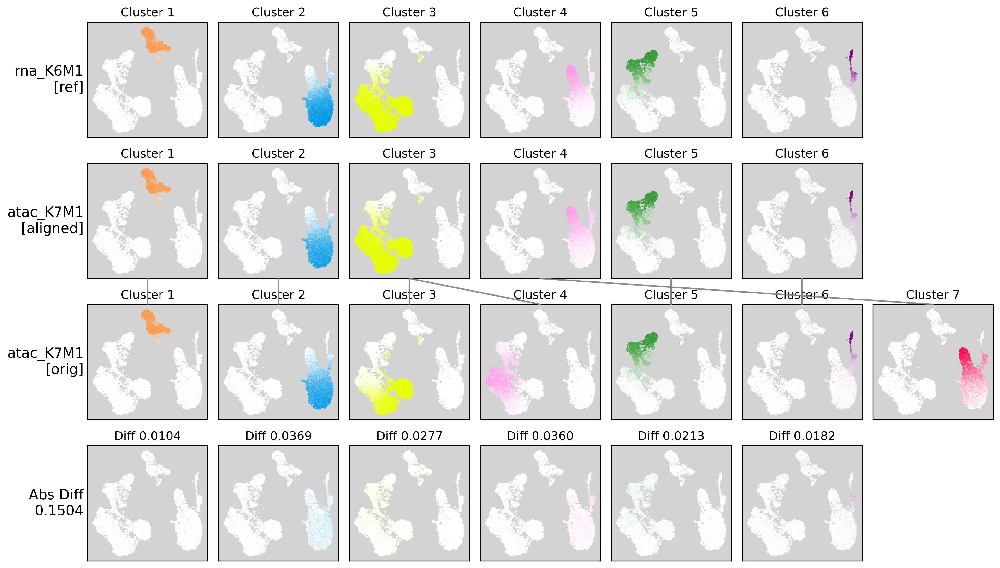

In [25]:
fig, axes = aoc.plot_mapping_grid(
    ref_Q=ref_Q, alt_Q=alt_Q,
    pair_mappings=pair_mappings,
    ref_mode=ref_mode, alt_mode=alt_mode,
    coords=X_umap,
    colors=default_colors[:max(ref_K, alt_K)],
    show=("alt", "mapped_alt", "diff"),
    s=0.2, dpi=300,
    connect_lw=1.5, connect_alpha=0.9, connect_color="gray",
)
fig.savefig(res_dir / f"mapping_grid_{ref_mode}_to_{alt_mode}.png", bbox_inches="tight", dpi=300)

### Feature Signatures per Modality

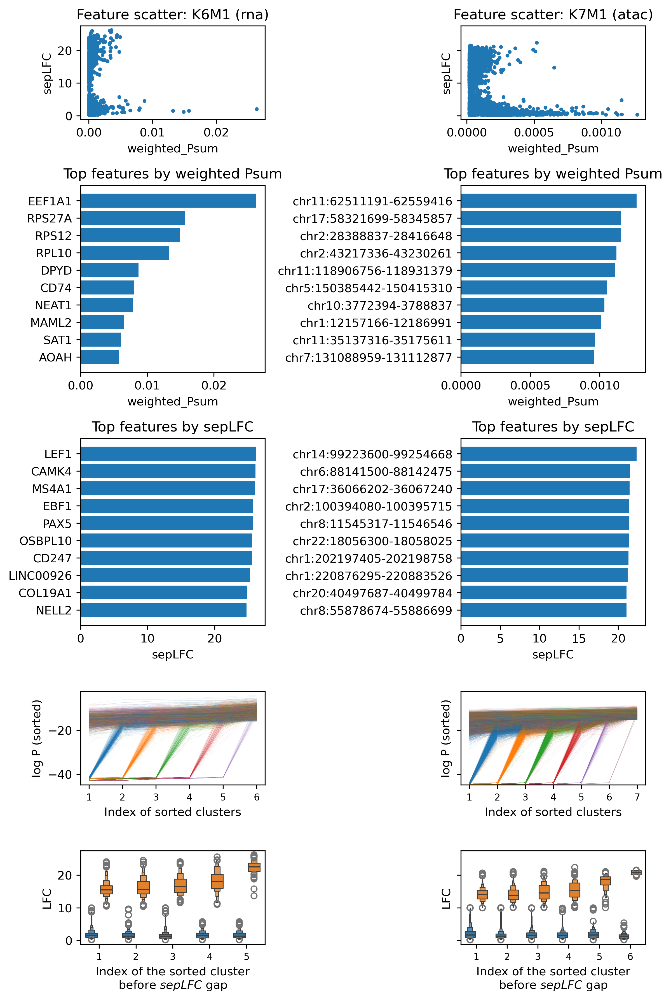

In [22]:
fig, axes = plt.subplots(
    5, 2, figsize=(8, 12), dpi=300,
    gridspec_kw={"height_ratios": [1, 2, 2, 1, 1]},
    constrained_layout=True,
)
for i_model, model in enumerate(models):
    mode     = selected_modes[model]
    df_mode  = aoc.compute_all_feature_metrics(
        res_models[model], feature_names=used_features[model]
    )[mode]
    aoc.plot_feature_scatter(df_mode, mode_name=mode, ax=axes[0, i_model])
    aoc.plot_feature_bar(df_mode, mode_name=mode, metric="weighted_Psum",
                         top_n=10, ax=axes[1, i_model])
    axes[1, i_model].set_title("Top features by weighted Psum")
    aoc.plot_feature_bar(df_mode, mode_name=mode, metric="sepLFC",
                         top_n=10, ax=axes[2, i_model])
    axes[2, i_model].set_title("Top features by sepLFC")
    aoc.plot_mode_P_profile(res_models[model], mode_name=mode, ax=axes[3, i_model])
    axes[3, i_model].set_title("")
    axes[3, i_model].set_ylabel("log P (sorted)")
    aoc.plot_sepLFC_dist(res_models[model], mode_name=mode,
                         lfc_threshold=10, ax=axes[4, i_model])
    axes[4, i_model].set_title("")
for r in range(axes.shape[0]):
    if r not in (1, 2):
        axes[r, 1].sharey(axes[r, 0])
        axes[r, 1].tick_params(labelleft=False)
for i_model, model in enumerate(models):
    axes[0, i_model].set_title(f"Feature scatter: {selected_modes[model]} ({model})")


### Average Cluster Membership by Cell Type

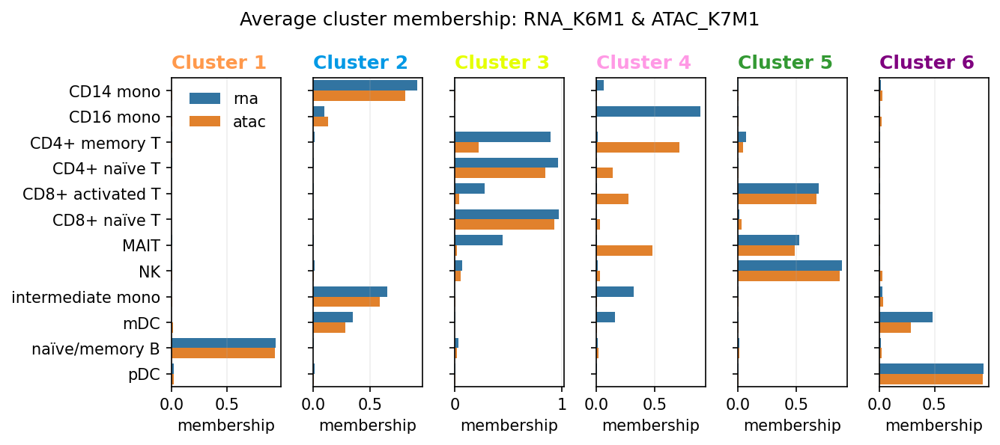

In [26]:
avg_cls_memberships = aoc.compute_avg_memberships(
    models=models, res_models=res_models,
    selected_modes=selected_modes,
    annotation_labels=annotation_labels,
    sort_groups=False,
)
fig, axes = aoc.plot_avg_membership_barh(
    avg_cls_memberships,
    annot_col="annot", model_order=["rna", "atac"],
    cluster_mode="auto", colors=default_colors,
    figsize_per_cluster=(1.5, 4.0),
)
for i_ax, ax in enumerate(axes):
    ax.set_title(f"Cluster {i_ax + 1}", c=default_colors[i_ax],
                 fontsize=12, loc="left", weight="bold")
fig.suptitle(
    f"Average cluster membership: RNA_{selected_modes['rna']} & ATAC_{selected_modes['atac']}"
)
fig.tight_layout()

fig.savefig(res_dir / "avg_cluster_memberships.png", bbox_inches="tight", dpi=300)

### FSTruct: Cluster Separation by Cell Type

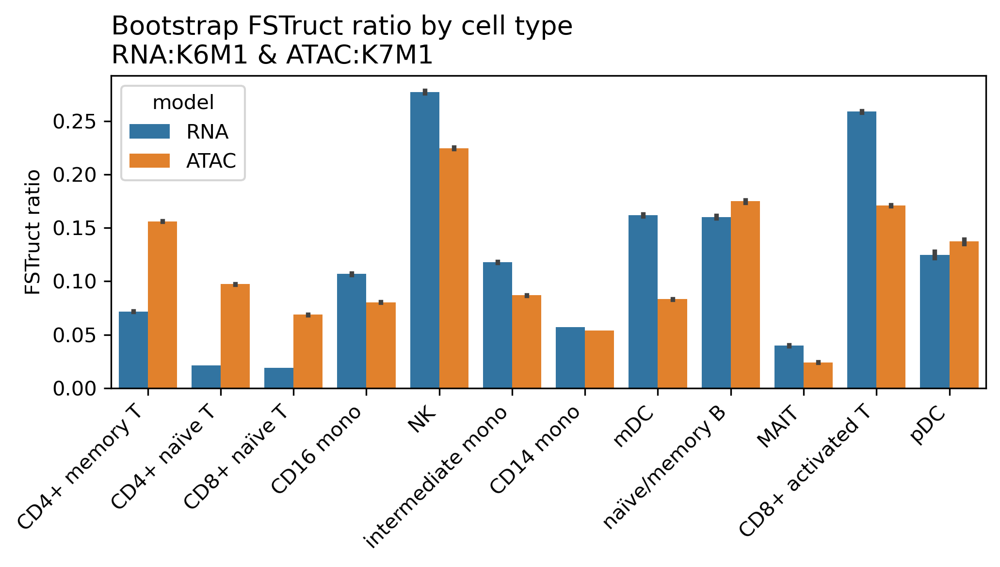

In [27]:
df_boot_ref = aoc.bootstrap_fstruct_by_group(ref_Q, annotation_labels)
df_boot_alt = aoc.bootstrap_fstruct_by_group(alt_Q, annotation_labels)
df_boot = pd.concat(
    [df.assign(model=key)
     for key, df in zip(selected_modes.keys(), [df_boot_ref, df_boot_alt])],
    ignore_index=True,
)
df_boot["model"] = df_boot["model"].str.upper()

fig, ax = plt.subplots(figsize=(7, 4), dpi=300)
sns.barplot(data=df_boot, x="annot", y="ratio", hue="model",
            estimator=np.mean, errorbar=("ci", 95), ax=ax)
ax.set_ylabel("FSTruct ratio")
ax.set_xlabel("")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title(
    f"Bootstrap FSTruct ratio by cell type\n"
    f"RNA:{selected_modes['rna']} & ATAC:{selected_modes['atac']}",
    fontsize=13, loc="left",
)
fig.tight_layout()
fig.savefig(res_dir / "bootstrap_fstruct_ratio.png", bbox_inches="tight", dpi=300)

## 6. Gene–Peak Link Analysis

For the selected modes, identify gene–peak pairs that:
(a) separate the **same set of clusters** across modalities (matched `sepCls`), and
(b) are physically linked by **genomic proximity** and/or **3D-chromatin cCRE** annotation.

### Feature Metrics for Selected Modes

In [28]:
# Compute per-cluster feature metrics for the selected modes
df_pvs_genes = aoc.compute_all_feature_metrics(
    res_models["rna"], feature_names=used_features["rna"]
)[selected_modes["rna"]]
df_pvs_peaks = aoc.compute_all_feature_metrics(
    res_models["atac"], feature_names=used_features["atac"]
)[selected_modes["atac"]]

for df, label in [(df_pvs_genes, "RNA genes"), (df_pvs_peaks, "ATAC peaks")]:
    df["rank_weighted_Psum"] = df["weighted_Psum"].rank(ascending=False, method="min")
    df["rank_sepLFC"]        = df["sepLFC"].rank(ascending=False, method="min")
    print(f"{label}: {len(df)} features")


RNA genes: 3026 features
ATAC peaks: 14896 features


### Proximal Gene–Peak Pairs

In [29]:
# Vectorised: keep only annotation rows where both gene and peak are in our feature sets
df_gene_peak_proximal = (
    peak_annot_flat[
        peak_annot_flat["gene"].isin(df_pvs_genes.index)
        & peak_annot_flat["peak"].isin(df_pvs_peaks.index)
    ][["gene", "peak", "distance", "peak_type"]]
    .drop_duplicates()
    .reset_index(drop=True)
)
proximal_set = set(zip(df_gene_peak_proximal["gene"], df_gene_peak_proximal["peak"]))
print(f"Proximal gene-peak pairs: {len(df_gene_peak_proximal)}")
print(f"  {df_gene_peak_proximal['gene'].nunique()} unique genes, "
      f"{df_gene_peak_proximal['peak'].nunique()} unique peaks")


Proximal gene-peak pairs: 4102
  1781 unique genes, 3893 unique peaks


### Match sepCls Patterns Across Modalities

In [30]:
def get_unordered_sepCls(sepCls):
    return (set(sorted(sepCls[0])), set(sorted(sepCls[1])))

def get_matched_sepCls(a_sepCls, pair_mapping):
    """Map ATAC cluster indices to RNA cluster indices via pair_mapping."""
    matched_L = [p[0] for g in a_sepCls[0] for p in pair_mapping if g == p[1]]
    matched_H = [p[0] for g in a_sepCls[1] for p in pair_mapping if g == p[1]]
    return (set(sorted(matched_L)), set(sorted(matched_H)))

df_pvs_genes["sepCls_unord"] = df_pvs_genes["sepCls"].apply(get_unordered_sepCls)
df_pvs_peaks["sepCls_unord"] = df_pvs_peaks["sepCls"].apply(get_unordered_sepCls)

peak_sepCls_uniq = (
    df_pvs_peaks["sepCls_unord"]
    .map(lambda t: tuple(map(frozenset, t)))
    .unique()
)
rows = []
for peak_sepCls in peak_sepCls_uniq:
    peak_idx = [i for i, v in enumerate(df_pvs_peaks["sepCls_unord"].values)
                if peak_sepCls == v]
    gene_sepCls_matched = get_matched_sepCls(peak_sepCls, pair_mapping)
    gene_idx = [i for i, v in enumerate(df_pvs_genes["sepCls_unord"].values)
                if gene_sepCls_matched == v]
    rows.append({
        "gene_sepCls": tuple(map(frozenset, gene_sepCls_matched)),
        "peak_sepCls": peak_sepCls,
        "gene_indices": gene_idx,
        "peak_indices": peak_idx,
    })

df_sepCls_pairs = pd.DataFrame(rows)
print(f"sepCls pattern pairs: {len(df_sepCls_pairs)}")
df_sepCls_pairs.to_csv(
    res_dir / f"gene_peak_sepCls_pairs({ref_mode}-{alt_mode}).csv", index=True
)


sepCls pattern pairs: 124


### Pre-compute Lookups for cCRE Analysis

In [31]:
# Load cCREs overlapping any ATAC peak in the analysis
bed_path = base_dir / "data" / "cCREs" / "GRCh38-cCREs.bed"
ccres_rows, kept_ccres_ids = aoc.filter_bed_by_peaks(
    bed_path, peak_annotations["peak"].tolist(), ccre_id_col=4,
)
print(f"{len(ccres_rows)} cCREs overlap with ATAC peaks used in the analysis.")

# Index cCRE rows by chrom for fast per-iteration overlap filtering
ccres_by_chrom = defaultdict(list)   # chrom → [(start, end, ccre_id), ...]
for row in ccres_rows:
    ccres_by_chrom[row[0]].append((int(row[1]), int(row[2]), row[4]))

# Pre-compute: for each ATAC peak in df_pvs_peaks, which cCRE IDs overlap it
peak_to_ccre_ids = {}
for peak in df_pvs_peaks.index:
    chrom, se = peak.split(":")
    s, e = map(int, se.split("-"))
    peak_to_ccre_ids[peak] = {
        ccre_id
        for cs, ce, ccre_id in ccres_by_chrom.get(chrom, [])
        if not (e < cs or ce < s)
    }
print(f"Peak→cCRE index built for {len(peak_to_ccre_ids)} peaks.")


371576 cCREs overlap with ATAC peaks used in the analysis.
Peak→cCRE index built for 14896 peaks.


In [32]:
# Load the 3D-chromatin gene-link file once (filtered to our cCREs)
link_type = "3D-Chromatin"
link_file = base_dir / "data" / "cCREs" / f"V4-hg38.Gene-Links.{link_type}.txt"
_, gene_links_rows = aoc.filter_gene_links_by_ccre(
    link_file, kept_ccres_ids, ccre_id_col=0, keep_header=False,
)
df_gene_links = pd.DataFrame(
    gene_links_rows,
    columns=["cCRE ID", "Gene ID", "Common Gene Name", "Gene Type",
             "Assay Type", "Experiment ID", "Biosample", "Score", "P-value"],
)
df_gene_links["Common Gene Name"] = df_gene_links["Common Gene Name"].str.strip()

# Build cCRE ID → set of gene names (restricted to RNA features) for O(1) lookup
ccre_to_genes = (
    df_gene_links[df_gene_links["Common Gene Name"].isin(df_pvs_genes.index)]
    .groupby("cCRE ID")["Common Gene Name"]
    .apply(set)
    .to_dict()
)
print(f"{len(gene_links_rows)} gene links loaded; {len(ccre_to_genes)} cCREs have RNA gene annotations.")


23645841 gene links loaded; 177609 cCREs have RNA gene annotations.


### Loop: Proximity + cCRE Links per sepCls Pattern

For each matched sepCls pattern, collect gene–peak pairs supported by proximity
and/or 3D-chromatin cCRE links. Results are saved per-pattern to CSV.

*Run once; results can be reloaded in Section 7.*

In [33]:
mode_pair_res_dir = res_dir / f"{ref_mode}-{alt_mode}"
mode_pair_res_dir.mkdir(exist_ok=True, parents=True)

for i in range(len(df_sepCls_pairs)):
    gene_indices = df_sepCls_pairs.loc[i]["gene_indices"]
    peak_indices = df_sepCls_pairs.loc[i]["peak_indices"]

    gene_set = set(df_pvs_genes.iloc[gene_indices].index)
    peak_set = set(df_pvs_peaks.iloc[peak_indices].index)

    # --- Proximity annotation (O(1) set lookup) ---
    proximal_pairs = {
        (g, p) for g in gene_set for p in peak_set if (g, p) in proximal_set
    }

    # --- cCRE annotation (pre-computed dicts, no file I/O) ---
    ccres_pairs = {
        (gene, peak)
        for peak in peak_set
        for ccre_id in peak_to_ccre_ids.get(peak, set())
        for gene in ccre_to_genes.get(ccre_id, set())
        if gene in gene_set
    }

    # --- Combine and save ---
    all_pairs = proximal_pairs | ccres_pairs
    if all_pairs:
        df_out = pd.DataFrame([
            {
                "gene": g, "peak": p,
                "gene_weighted_Psum": df_pvs_genes.loc[g, "weighted_Psum"],
                "gene_sepLFC":        df_pvs_genes.loc[g, "sepLFC"],
                "peak_weighted_Psum": df_pvs_peaks.loc[p, "weighted_Psum"],
                "peak_sepLFC":        df_pvs_peaks.loc[p, "sepLFC"],
                "is_in_proximity": (g, p) in proximal_pairs,
                "is_in_ccres":     (g, p) in ccres_pairs,
            }
            for g, p in all_pairs
        ])
    else:
        df_out = pd.DataFrame(columns=[
            "gene", "peak",
            "gene_weighted_Psum", "gene_sepLFC",
            "peak_weighted_Psum", "peak_sepLFC",
            "is_in_proximity", "is_in_ccres",
        ])
    df_out.to_csv(mode_pair_res_dir / f"gene_peak_links_sepCls{i}.csv", index=False)

print(f"Done. Results saved to {mode_pair_res_dir}")


Done. Results saved to /oscar/data/sramacha/users/xliu293/sc-clumppling/output/comp_models/pbmc10k-hv_ft_links_new/rna_K6M1-atac_K7M1


## 7. Aggregate & Visualize Gene–Peak Links

Load saved per-sepCls CSVs and visualize patterns.

In [34]:
# Reload df_sepCls_pairs if starting fresh (eval string-encoded lists/tuples)
# mode_pair_res_dir = res_dir / f"{ref_mode}-{alt_mode}"
# df_sepCls_pairs = pd.read_csv(
#     res_dir / f"gene_peak_sepCls_pairs({ref_mode}-{alt_mode}).csv", index_col=0
# )
# df_sepCls_pairs['gene_indices'] = df_sepCls_pairs['gene_indices'].apply(eval)
# df_sepCls_pairs['peak_indices'] = df_sepCls_pairs['peak_indices'].apply(eval)

# Load and concatenate all per-pattern results
records = []
n_annotated = []
for i in range(len(df_sepCls_pairs)):
    df_i = pd.read_csv(mode_pair_res_dir / f"gene_peak_links_sepCls{i}.csv")
    n_annotated.append(len(df_i))
    if len(df_i):
        df_i["sepCls_idx"] = i
        records.append(df_i)

df_sepCls_pairs_metrics = pd.concat(records, ignore_index=True)

# Attach counts and text labels to df_sepCls_pairs
df_sepCls_pairs["n_genes"]          = df_sepCls_pairs["gene_indices"].apply(len)
df_sepCls_pairs["n_peaks"]          = df_sepCls_pairs["peak_indices"].apply(len)
df_sepCls_pairs["n_annotated_pairs"] = n_annotated
df_sepCls_pairs["frac_sum"] = (
    df_sepCls_pairs["n_genes"] / len(df_pvs_genes)
    + df_sepCls_pairs["n_peaks"] / len(df_pvs_peaks)
)

def _sepCls_text(x):
    a, b = eval(x) if isinstance(x, str) else x
    return "{} | {}".format(
        ",".join(str(e+1) for e in sorted(a)),
        ",".join(str(e+1) for e in sorted(b)),
    )

df_sepCls_pairs["gene_sepCls_text"] = df_sepCls_pairs["gene_sepCls"].apply(_sepCls_text)
df_sepCls_pairs["peak_sepCls_text"] = df_sepCls_pairs["peak_sepCls"].apply(_sepCls_text)
df_sepCls_pairs["text"] = df_sepCls_pairs.apply(
    lambda r: f"Gene: {r['gene_sepCls_text']}\nPeak: {r['peak_sepCls_text']}", axis=1
)
print(f"Total annotated gene-peak pairs across all sepCls: {len(df_sepCls_pairs_metrics)}")


Total annotated gene-peak pairs across all sepCls: 1017


### Top sepCls Patterns by Feature Coverage

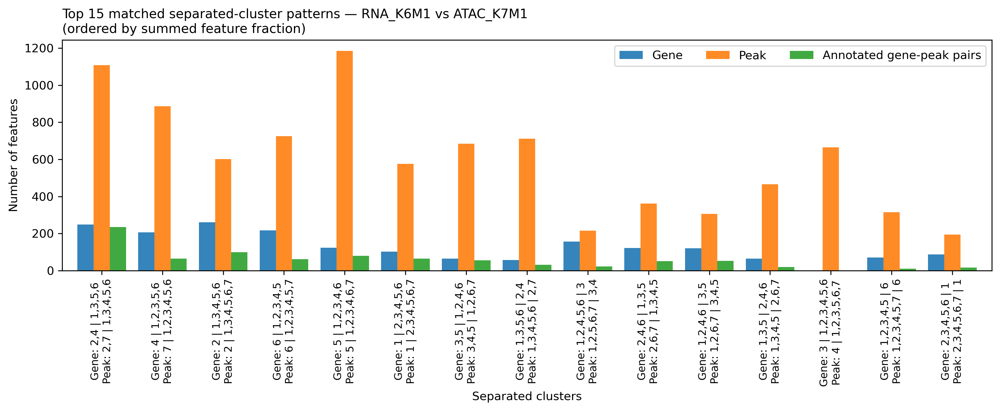

In [35]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=300)
cols = ["n_genes", "n_peaks", "n_annotated_pairs"]
(
    df_sepCls_pairs
    .sort_values("frac_sum", ascending=False)
    .head(15)
    .set_index("text")[cols]
    .rename(columns={"n_genes": "Gene", "n_peaks": "Peak",
                     "n_annotated_pairs": "Annotated gene-peak pairs"})
    .plot(kind="bar", width=0.8, alpha=0.9, ax=ax)
)
ax.legend(title="", ncol=3, bbox_to_anchor=(1, 1), loc="upper right")
ax.set_ylabel("Number of features")
ax.set_xlabel("Separated clusters")
ax.tick_params(axis="x", labelsize=9, rotation=90)
ax.set_title(
    f"Top 15 matched separated-cluster patterns — "
    f"{ref_mode.upper()} vs {alt_mode.upper()}\n"
    f"(ordered by summed feature fraction)",
    fontsize=11, loc="left",
)
fig.tight_layout()
fig.savefig(res_dir / "matched_separated_clusters.png", bbox_inches="tight", dpi=300)

### Feature Metric Scatter: All Gene–Peak Pairs

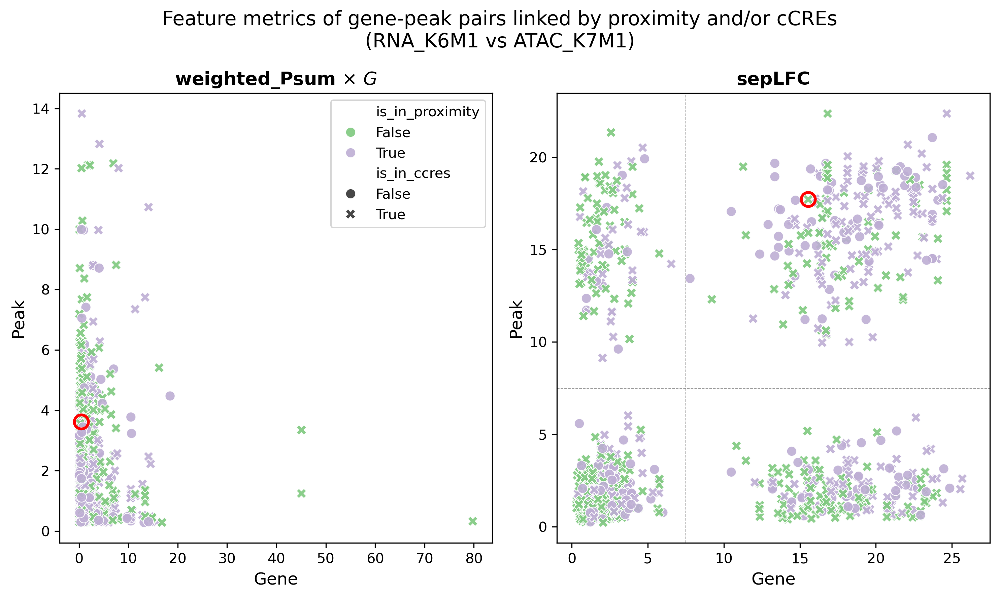

In [36]:
df_sepCls_pairs_metrics["gene_weighted_Psum_scaled"] = (
    df_sepCls_pairs_metrics["gene_weighted_Psum"] * len(df_pvs_genes)
)
df_sepCls_pairs_metrics["peak_weighted_Psum_scaled"] = (
    df_sepCls_pairs_metrics["peak_weighted_Psum"] * len(df_pvs_peaks)
)

fig, axes = plt.subplots(1, 2, figsize=(10, 6), dpi=300)
scatter_kw = dict(hue="is_in_proximity", style="is_in_ccres",
                  palette="Accent", s=50, alpha=0.9)
ax = axes[0]
sns.scatterplot(data=df_sepCls_pairs_metrics,
                x="gene_weighted_Psum_scaled", y="peak_weighted_Psum_scaled",
                ax=ax, **scatter_kw)
ax.set_title(r'weighted_Psum $\times\ G$', fontsize=13, weight='bold')
ax.set_xlabel("Gene", fontsize=12)
ax.set_ylabel("Peak", fontsize=12)
ax = axes[1]
sns.scatterplot(data=df_sepCls_pairs_metrics,
                x="gene_sepLFC", y="peak_sepLFC",
                ax=ax, **scatter_kw)
ax.axhline(7.5, color="gray", linestyle="--", linewidth=0.5)
ax.axvline(7.5, color="gray", linestyle="--", linewidth=0.5)
ax.set_title("sepLFC", fontsize=13, weight='bold')
ax.set_xlabel("Gene", fontsize=12)
ax.set_ylabel("Peak", fontsize=12)
ax.legend().remove()

# Highlight example pair
ex_gene, ex_peak = "BTLA", "chr3:114212642-114216815"
pt = df_sepCls_pairs_metrics[
    (df_sepCls_pairs_metrics["gene"] == ex_gene)
    & (df_sepCls_pairs_metrics["peak"] == ex_peak)
]
for ax, xcol, ycol in [
    (axes[0], "gene_weighted_Psum_scaled", "peak_weighted_Psum_scaled"),
    (axes[1], "gene_sepLFC", "peak_sepLFC"),
]:
    if not pt.empty:
        ax.scatter(pt[xcol], pt[ycol], s=100,
                   facecolors="none", edgecolors="red", linewidths=2)

fig.suptitle(
    f"Feature metrics of gene-peak pairs linked by proximity and/or cCREs\n"
    f"({ref_mode.upper()} vs {alt_mode.upper()})",
    fontsize=14,
)
fig.tight_layout()
fig.savefig(res_dir / "linked_gene_peak_metrics.png", bbox_inches="tight", dpi=300)

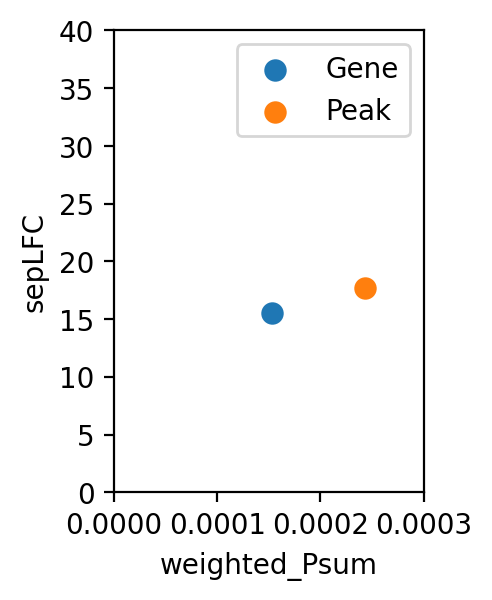

In [ ]:
# plot the sepLFC vs. weighted Psum for the selected gene and peak
fig, ax = plt.subplots(1, 1, figsize=(2,3), dpi=200)
ax.scatter(df_pvs_genes.loc[ex_gene]["weighted_Psum"],
           df_pvs_genes.loc[ex_gene]["sepLFC"], 
           s=50, alpha=1, color="C0", label="Gene")
ax.scatter(df_pvs_peaks.loc[ex_peak]["weighted_Psum"],
           df_pvs_peaks.loc[ex_peak]["sepLFC"], 
           s=50, alpha=1, color="C1", label="Peak")
ax.set_ylabel("sepLFC")
ax.set_ylim(0,40)
ax.set_xlabel("weighted_Psum")
ax.set_xlim(0,0.0003)
ax.legend()
fig.savefig(res_dir / "selected_gene_peak_scatter.png", bbox_inches="tight", dpi=200)


### Proximity vs cCRE Overlap (Venn Diagrams)

In [37]:
import math
from matplotlib.patches import Circle

def _circle_intersection_area(r1, r2, d):
    if d >= r1 + r2: return 0.0
    if d <= abs(r1 - r2): return math.pi * min(r1, r2) ** 2
    a1 = r1**2 * math.acos((d**2 + r1**2 - r2**2) / (2*d*r1))
    a2 = r2**2 * math.acos((d**2 + r2**2 - r1**2) / (2*d*r2))
    a3 = 0.5 * math.sqrt((-d+r1+r2)*(d+r1-r2)*(d-r1+r2)*(d+r1+r2))
    return a1 + a2 - a3

def _solve_d_for_overlap(r1, r2, target, iters=80):
    lo, hi = abs(r1-r2), r1+r2
    target = max(0.0, min(target, math.pi * min(r1,r2)**2))
    for _ in range(iters):
        mid = (lo+hi)/2
        if _circle_intersection_area(r1, r2, mid) > target: lo = mid
        else: hi = mid
    return (lo+hi)/2

def venn2_proportional(totalA, totalB, overlap, labels=("A","B"),
                        colors=("tab:blue","tab:orange"),
                        edgecolors=("black","black"), alpha=0.35, ax=None):
    r1 = math.sqrt(float(totalA) / math.pi)
    r2 = math.sqrt(float(totalB) / math.pi)
    d  = _solve_d_for_overlap(r1, r2, float(overlap))
    if ax is None: fig, ax = plt.subplots(figsize=(6,4))
    ax.add_patch(Circle((0, 0), r1, facecolor=colors[0], edgecolor=edgecolors[0], alpha=alpha, lw=2))
    ax.add_patch(Circle((d, 0), r2, facecolor=colors[1], edgecolor=edgecolors[1], alpha=alpha, lw=2))
    ax.text(-r1*0.45, 0, str(int(totalA-overlap)), ha="center", va="center")
    ax.text(d+r2*0.45, 0, str(int(totalB-overlap)), ha="center", va="center")
    ax.text(d/2,       0, str(int(overlap)),         ha="center", va="center")
    ax.text(-r1*0.98, r1*1.02, labels[0], ha="left",  va="bottom")
    ax.text(d+r2*0.98, r2*1.02, labels[1], ha="right", va="bottom")
    ax.set_aspect("equal", adjustable="datalim")
    ax.axis("off"); ax.relim(); ax.autoscale_view()
    return ax


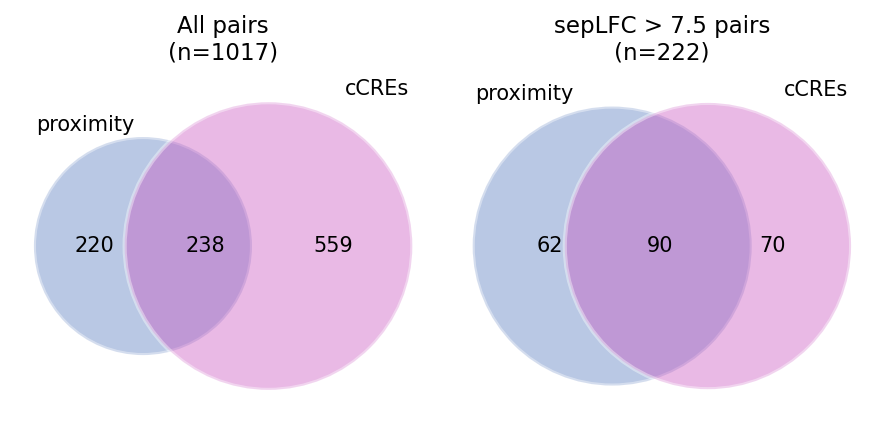

In [39]:
venn_kw = dict(labels=("proximity","cCREs"),
               colors=("#5277BC","#CA52C0"),
               edgecolors=("white","white"), alpha=0.4)

fig, axes = plt.subplots(1, 2, figsize=(6, 3), dpi=150)
for ax, df_sub, title in [
    (axes[0], df_sepCls_pairs_metrics,
     f"All pairs"),
    (axes[1],
     df_sepCls_pairs_metrics[
         (df_sepCls_pairs_metrics["gene_sepLFC"] > 7.5)
         & (df_sepCls_pairs_metrics["peak_sepLFC"] > 7.5)
     ],
     "sepLFC > 7.5 pairs"),
]:
    cm = pd.crosstab(df_sub["is_in_proximity"], df_sub["is_in_ccres"],
                     rownames=["proximity"], colnames=["cCREs"])
    venn2_proportional(
        totalA=cm.loc[True].sum(), totalB=cm[True].sum(),
        overlap=cm.loc[True][True], ax=ax, **venn_kw,
    )
    ax.set_title(f"{title}\n(n={len(df_sub)})", fontsize=11)
fig.tight_layout()
fig.savefig(res_dir / "venn_proximity_ccres.png", bbox_inches="tight", dpi=300)

### Proximity-Annotated Pairs: Rank Concordance

In [40]:
# Build table of all proximal gene-peak pairs with feature metrics from both modalities
df_mapped = (
    peak_annot_flat[
        peak_annot_flat["gene"].isin(df_pvs_genes.index)
        & peak_annot_flat["peak"].isin(df_pvs_peaks.index)
    ][["gene", "peak", "distance", "peak_type"]]
    .drop_duplicates(subset=["gene", "peak"])
    .reset_index(drop=True)
)
df_mapped = (
    df_mapped
    .join(df_pvs_genes[["weighted_Psum", "sepLFC", "rank_weighted_Psum",
                         "rank_sepLFC", "sepCls"]].add_prefix("gene_"),
          on="gene")
    .join(df_pvs_peaks[["weighted_Psum", "sepLFC", "rank_weighted_Psum",
                         "rank_sepLFC", "sepCls"]].add_prefix("peak_"),
          on="peak")
)
for col in df_mapped.filter(like="rank").columns:
    df_mapped[col] = df_mapped[col].astype(int)
print(f"Proximity-annotated gene-peak pairs: {len(df_mapped)}")


Proximity-annotated gene-peak pairs: 4102


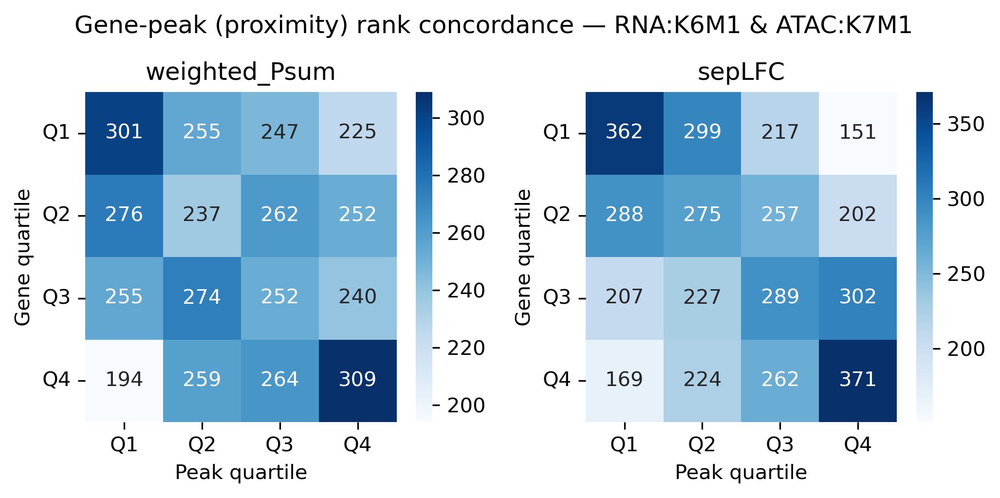

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(7, 3.5), dpi=300)
for ax, rank_col, title in [
    (axes[0], "rank_weighted_Psum", "weighted_Psum"),
    (axes[1], "rank_sepLFC",        "sepLFC"),
]:
    df_mapped[f"gene_q"] = pd.qcut(df_mapped[f"gene_{rank_col}"], q=4, labels=False)
    df_mapped[f"peak_q"] = pd.qcut(df_mapped[f"peak_{rank_col}"], q=4, labels=False)
    ct = pd.crosstab(df_mapped["gene_q"], df_mapped["peak_q"])
    sns.heatmap(ct, annot=True, fmt="d", cmap="Blues", ax=ax)
    ax.set_xlabel("Peak quartile")
    ax.set_xticklabels(["Q1","Q2","Q3","Q4"], rotation=0)
    ax.set_ylabel("Gene quartile")
    ax.set_yticklabels(["Q1","Q2","Q3","Q4"], rotation=0)
    ax.set_title(title, fontsize=12)
fig.suptitle(
    f"Gene-peak (proximity) rank concordance — "
    f"RNA:{selected_modes['rna']} & ATAC:{selected_modes['atac']}",
    y=0.96, x=0.08, ha="left",
)
fig.tight_layout()
fig.savefig(res_dir / "proximity_rank_concordance.png", bbox_inches="tight", dpi=300)